Data Manipulation & Visualization project for Start2impact by Oliva Bautista

# Environmental impact of world food production analysis

# Discovery

Our world population is expected to grow from 7.3 billion today to 9.7 billion in the year 2050. Finding solutions for feeding the growing world population has become a hot topic for food and agriculture organizations, entrepreneurs, and philanthropists. These solutions range from changing the way we grow our food to change the way we eat. To make things harder, the world's climate is changing and it is both affecting and affected by the way we grow our food – agriculture.
Source: https://www.kaggle.com/datasets/dorbicycle/world-foodfeed-production

By analyzing the data we want to find out which food is more sustainable and which is less sustainable. This sustainability will consider the number of resources needed and the environmental pollution related to the nutrition value that this food provides.

_____________________________________________________________________________________________________________________________

In [41]:
#importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import os
import tabulate as tb
import warnings
warnings. filterwarnings('ignore')
#setting the working directory to a folder in which all the datasets used in the project are.
os.chdir("C:\\Users\\bauol\\Desktop\\Bautista\\Start2impact\\DataScience\\progettoDS_DataManVis\\" )

# Data selection

### First dataset

https://www.kaggle.com/dorbicycle/world-foodfeed-production

The Food and Agriculture Organization of the United Nations provides free access to food and agriculture data for over 245 countries and territories, from the year 1961 to the most recent update (depending on the dataset). One dataset from the FAO's database is the Food Balance Sheets. It presents a comprehensive picture of the pattern of a country's food supply during a specified reference period, the last time an update was loaded to the FAO database was in 2013. The food balance sheet shows for each food item the sources of supply and its utilization. This chunk of the dataset is focused on two utilizations of each food item available:

#Food - refers to the total amount of food items available as human food during the reference period. #Feed - refers to the number of food items available for feeding to the livestock and poultry during the reference period.

In [42]:
#importing the first dataset and reading some lines of it.
FAO = pd.read_csv('FAO.csv', encoding='latin1')
#creating a copy
FAO_copy=FAO
FAO.head()

,Area Abbreviation,Area Code,Area,Item Code,Item,Element Code,Element,Unit,latitude,longitude,...,Y2004,Y2005,Y2006,Y2007,Y2008,Y2009,Y2010,Y2011,Y2012,Y2013
0,AFG,2,Afghanistan,2511,Wheat and products,5142,Food,1000 tonnes,33.94,67.71,...,3249.0,3486.0,3704.0,4164.0,4252.0,4538.0,4605.0,4711.0,4810,4895
1,AFG,2,Afghanistan,2805,Rice (Milled Equivalent),5142,Food,1000 tonnes,33.94,67.71,...,419.0,445.0,546.0,455.0,490.0,415.0,442.0,476.0,425,422
2,AFG,2,Afghanistan,2513,Barley and products,5521,Feed,1000 tonnes,33.94,67.71,...,58.0,236.0,262.0,263.0,230.0,379.0,315.0,203.0,367,360
3,AFG,2,Afghanistan,2513,Barley and products,5142,Food,1000 tonnes,33.94,67.71,...,185.0,43.0,44.0,48.0,62.0,55.0,60.0,72.0,78,89
4,AFG,2,Afghanistan,2514,Maize and products,5521,Feed,1000 tonnes,33.94,67.71,...,120.0,208.0,233.0,249.0,247.0,195.0,178.0,191.0,200,200


### Second dataset

https://data.worldbank.org/indicator/SP.POP.TOTL?most_recent_year_desc=true

I'll integrate the first dataset with this second one that represents the population for each country for each of the years considered in the first dataset. I'll look at the production pro capita to compare countries production weighting the data on population. 

In [43]:
#importing the second dataset and reading some lines of it.
POP = pd.read_csv('Populations.csv', index_col="Country Code")
POP.head()

,Country Name,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,1966,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Country Code,,,,,,,,,,,,,,,,,,,,,
ABW,Aruba,"Population, total",SP.POP.TOTL,54208.0,55434.0,56234.0,56699.0,57029.0,57357.0,57702.0,...,102565.0,103165.0,103776.0,104339.0,104865.0,105361.0,105846.0,106310.0,106766.0,NaN
AFE,Africa Eastern and Southern,"Population, total",SP.POP.TOTL,130836765.0,134159786.0,137614644.0,141202036.0,144920186.0,148769974.0,152752671.0,...,547482863.0,562601578.0,578075373.0,593871847.0,609978946.0,626392880.0,643090131.0,660046272.0,677243299.0,NaN
AFG,Afghanistan,"Population, total",SP.POP.TOTL,8996967.0,9169406.0,9351442.0,9543200.0,9744772.0,9956318.0,10174840.0,...,31161378.0,32269592.0,33370804.0,34413603.0,35383028.0,36296111.0,37171922.0,38041757.0,38928341.0,NaN
AFW,Africa Western and Central,"Population, total",SP.POP.TOTL,96396419.0,98407221.0,100506960.0,102691339.0,104953470.0,107289875.0,109701811.0,...,370243017.0,380437896.0,390882979.0,401586651.0,412551299.0,423769930.0,435229381.0,446911598.0,458803476.0,NaN
AGO,Angola,"Population, total",SP.POP.TOTL,5454938.0,5531451.0,5608499.0,5679409.0,5734995.0,5770573.0,5781305.0,...,25107925.0,26015786.0,26941773.0,27884380.0,28842482.0,29816769.0,30809787.0,31825299.0,32866268.0,NaN


### Third dataset

https://www.kaggle.com/datasets/selfvivek/environment-impact-of-food-production

This dataset contains most 43 most common foods grown across the globe and 23 columns as their respective land, water usage and carbon footprints.
These data represent greenhouse gas emissions per kg of food product(Kg CO2 - equivalents per kg product) across different stages in the lifecycle of food production.
Eutrophication – the pollution of water bodies and ecosystems with excess nutrients – is a major environmental problem. The runoff of nitrogen and other nutrients from agricultural production systems is a leading contributor.

In [44]:
FoodProduction = pd.read_csv("Food_Production.csv",index_col = 'Food product')
FoodProduction.head()

,Land use change,Animal Feed,Farm,Processing,Transport,Packging,Retail,Total_emissions,Eutrophying emissions per 1000kcal (gPO₄eq per 1000kcal),Eutrophying emissions per kilogram (gPO₄eq per kilogram),...,Freshwater withdrawals per 100g protein (liters per 100g protein),Freshwater withdrawals per kilogram (liters per kilogram),Greenhouse gas emissions per 1000kcal (kgCO₂eq per 1000kcal),Greenhouse gas emissions per 100g protein (kgCO₂eq per 100g protein),Land use per 1000kcal (m² per 1000kcal),Land use per kilogram (m² per kilogram),Land use per 100g protein (m² per 100g protein),Scarcity-weighted water use per kilogram (liters per kilogram),Scarcity-weighted water use per 100g protein (liters per 100g protein),Scarcity-weighted water use per 1000kcal (liters per 1000 kilocalories)
Food product,,,,,,,,,,,,,,,,,,,,,
Wheat & Rye (Bread),0.1,0.0,0.8,0.2,0.1,0.1,0.1,1.4,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Maize (Meal),0.3,0.0,0.5,0.1,0.1,0.1,0.0,1.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Barley (Beer),0.0,0.0,0.2,0.1,0.0,0.5,0.3,1.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Oatmeal,0.0,0.0,1.4,0.0,0.1,0.1,0.0,1.6,4.281357,11.23,...,371.076923,482.4,0.945482,1.907692,2.897446,7.6,5.846154,18786.2,14450.92308,7162.104461
Rice,0.0,0.0,3.6,0.1,0.1,0.1,0.1,4.0,9.514379,35.07,...,3166.760563,2248.4,1.207271,6.267606,0.759631,2.8,3.943662,49576.3,69825.77465,13449.891480


# Data cleaning, exploration and transformation

In [45]:
#starting with the first dataset.

# Fixing country names ("Area" columnn values) in order to have shorter names and so better visualizations (labels)
FAO.Area.loc[FAO.Area=="Bolivia (Plurinational State of)"]="Bolivia"
FAO.Area.loc[FAO.Area=="China, Hong Kong SAR"]="Hong Kong"
FAO.Area.loc[FAO.Area=="China, Macao SAR"]="Macao"
FAO.Area.loc[FAO.Area=="China, mainland"]="China"
FAO.Area.loc[FAO.Area=="China, Taiwan Province of"]="Taiwan"
FAO.Area.loc[FAO.Area=="Democratic People's Republic of Korea"]="North Korea"
FAO.Area.loc[FAO.Area=="Iran (Islamic Republic of)"]="Iran"
FAO.Area.loc[FAO.Area=="Republic of Korea"]="South Korea"
FAO.Area.loc[FAO.Area=="Republic of Moldova"]="Moldova"
FAO.Area.loc[FAO.Area=="Russian Federation"]="Russia"
FAO.Area.loc[FAO.Area=="The former Yugoslav Republic of Macedonia"]="North Macedonia"
FAO.Area.loc[FAO.Area=="United Arab Emirates"]="Arab Emirates"
FAO.Area.loc[FAO.Area=="United Kingdom"]="UK"
FAO.Area.loc[FAO.Area=="United Republic of Tanzania"]="Tanzania"
FAO.Area.loc[FAO.Area=="United States of America"]="USA"
FAO.Area.loc[FAO.Area=="Venezuela (Bolivarian Republic of)"]="Venezuela"

# Re-naming columns names avoiding " " character
FAO.rename(columns = {"Area Abbreviation":"Area_Abbreviation"}, inplace=True)

# Getting rid of some columns which contain the same information of others
# "Code ...." columns are usefull for joining different tables from the same database.
FAO.drop(["Area Code","Item Code","Element Code","Unit","latitude","longitude"],inplace=True, axis=1)

# Getting rid of decimal values because they are always "0"
for i in range(4,55):
    FAO[FAO.columns[i]]=FAO[FAO.columns[i]].astype("Int64")

#noticed that there are duplicated rows.
#to check an example of that: reload the dataset and move the '#' of the last row on the second-last row.
FAO = FAO.drop_duplicates(keep='first')
#FAO[FAO.Item=="Milk - Excluding Butter"].head(4)

In [46]:
print("The FAO dataset has", FAO.shape[0], "rows and ", FAO.shape[1], "columns.")
print("The data is based on ", FAO.Area.describe()[1], "countries and ", FAO.Item.describe()[1], "dirreferent classes of items." )

The FAO dataset has 21018 rows and  57 columns.
The data is based on  174 countries and  115 dirreferent classes of items.


In [47]:
# second dataset 

# Re-naming columns names of years data from like "Y2013" to just "2013" in order to make easier to make conditional columns selections
POP.rename(columns = {"Country Name":"Country_Name"}, inplace=True)
    
# Getting rid of some columns which contain the same information of others or no usefull infos
POP.drop(["Indicator Name","Indicator Code","2021"],inplace=True, axis=1)

# Keeping only nations we have food production data on
for i, nation  in enumerate(POP.index):
    if nation not in FAO.Area_Abbreviation.unique():
        POP.drop([nation], axis=0, inplace=True)
    else:
        pass

POP.head()

,Country_Name,1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Country Code,,,,,,,,,,,,,,,,,,,,,
AFG,Afghanistan,8996967.0,9169406.0,9351442.0,9543200.0,9744772.0,9956318.0,10174840.0,10399936.0,10637064.0,...,30117411.0,31161378.0,32269592.0,33370804.0,34413603.0,35383028.0,36296111.0,37171922.0,38041757.0,38928341.0
AGO,Angola,5454938.0,5531451.0,5608499.0,5679409.0,5734995.0,5770573.0,5781305.0,5774440.0,5771973.0,...,24220660.0,25107925.0,26015786.0,26941773.0,27884380.0,28842482.0,29816769.0,30809787.0,31825299.0,32866268.0
ALB,Albania,1608800.0,1659800.0,1711319.0,1762621.0,1814135.0,1864791.0,1914573.0,1965598.0,2022272.0,...,2905195.0,2900401.0,2895092.0,2889104.0,2880703.0,2876101.0,2873457.0,2866376.0,2854191.0,2837849.0
ARE,United Arab Emirates,92417.0,100801.0,112112.0,125130.0,138049.0,149855.0,159979.0,169768.0,182620.0,...,8946778.0,9141598.0,9197908.0,9214182.0,9262896.0,9360975.0,9487206.0,9630966.0,9770526.0,9890400.0
ARG,Argentina,20481781.0,20817270.0,21153042.0,21488916.0,21824427.0,22159644.0,22494031.0,22828872.0,23168268.0,...,41261490.0,41733271.0,42202935.0,42669500.0,43131966.0,43590368.0,44044811.0,44494502.0,44938712.0,45376763.0


In [48]:
# Creating a table from the FAO dataset which cointains the percentage growth of the production (from te previous year)
FAO_foodvsfeed = FAO.groupby("Element").sum()
FAO_foodvsfeed=FAO_foodvsfeed.transpose()
FAO_foodvsfeed["Food_percent"]=FAO_foodvsfeed.Food.pct_change()*100
FAO_foodvsfeed["Feed_percent"]=FAO_foodvsfeed.Feed.pct_change()*100    

FAO_foodvsfeed.head()

Element,Feed,Food,Food_percent,Feed_percent
Y1961,821878,2418262,NaN,NaN
Y1962,850832,2486745,2.831910,3.522907
Y1963,893940,2523609,1.482420,5.066570
Y1964,910709,2582492,2.333285,1.875853
Y1965,944899,2681913,3.849809,3.754218


In [49]:
print(f"The FoodProduction dataset has", FoodProduction.shape[0], "rows (products) and ", FoodProduction.shape[1], "variables.")

The FoodProduction dataset has 43 rows (products) and  22 variables.


In [50]:
# Cleaning the third dataset

# Deleting columns I decided not to use (I've decided to use the measurment of pollution every 1000kcal the food provide).
columns_to_delete = ['Eutrophying emissions per kilogram (gPO₄eq per kilogram)',
                    'Eutrophying emissions per 100g protein (gPO₄eq per 100 grams protein)',
                    'Freshwater withdrawals per kilogram (liters per kilogram)',
                    'Freshwater withdrawals per 100g protein (liters per 100g protein)',
                    'Greenhouse gas emissions per 100g protein (kgCO₂eq per 100g protein)',
                    'Land use per kilogram (m² per kilogram)',
                    'Land use per 100g protein (m² per 100g protein)',
                    'Scarcity-weighted water use per 100g protein (liters per 100g protein)',
                    'Scarcity-weighted water use per kilogram (liters per kilogram)']
FoodProduction = FoodProduction.drop(columns=columns_to_delete)

# Renaming columns in order to have easier names
FoodProduction.rename(columns = {'Eutrophying emissions per 1000kcal (gPO₄eq per 1000kcal)': 'EutrophyingEmissions',
                     'Freshwater withdrawals per 1000kcal (liters per 1000kcal)': 'FreshwaterWithdrawals',
                     'Greenhouse gas emissions per 1000kcal (kgCO₂eq per 1000kcal)': 'GreenhouseGasEmissions',
                     'Land use per 1000kcal (m² per 1000kcal)': 'LandUse',
                     'Scarcity-weighted water use per 1000kcal (liters per 1000 kilocalories)': 'ScarcityWeightedWaterUse'}, 
          inplace = True)

#sorting the dataset by "Total emissions"
FoodProduction.sort_values("Total_emissions", ascending=False,inplace=True)
#creating a variable which gives the ranking position by total emission
FoodProduction["rank"]= FoodProduction.reset_index().index +1

FoodProduction.head()

,Land use change,Animal Feed,Farm,Processing,Transport,Packging,Retail,Total_emissions,EutrophyingEmissions,FreshwaterWithdrawals,GreenhouseGasEmissions,LandUse,ScarcityWeightedWaterUse,rank
Food product,,,,,,,,,,,,,,
Beef (beef herd),16.3,1.9,39.4,1.3,0.3,0.2,0.2,59.6,110.406593,531.575092,36.439560,119.490842,12722.527470,1
Lamb & Mutton,0.5,2.4,19.5,1.1,0.5,0.3,0.2,24.5,30.640379,568.706625,12.529968,116.659306,44771.293380,2
Cheese,4.5,2.3,13.1,0.7,0.1,0.2,0.3,21.2,25.418605,1448.372093,6.170543,22.684755,46731.421190,3
Beef (dairy herd),0.9,2.5,15.7,1.1,0.4,0.3,0.2,21.1,133.805861,994.249084,12.197802,15.838828,43884.688640,4
Dark Chocolate,14.3,0.0,3.7,0.2,0.1,0.4,0.0,18.7,16.843327,104.564797,9.023211,13.338491,556.905222,5


## Data visualization

### Which countries produce the most?

In [51]:
#importing plotly.express to use its plotting functions.
import plotly.express as px
# Creating the graph with the geographical map
fig = px.choropleth(FAO.groupby(["Area","Area_Abbreviation"]).sum().reset_index(),locations="Area_Abbreviation", color="Y2013",hover_name="Area", height=500,title="Production", color_continuous_scale= [[0, 'rgb(240,240,240)'],
                      [0.1, 'rgb(191,247,202)'],
                      [0.20, 'rgb(4,145,32)'],
                      [1, 'rgb(227,26,28)']])
fig.show() # sometimes China's color doesn't work properly. Couldnt't understand when and why, but data is correct. Should be red

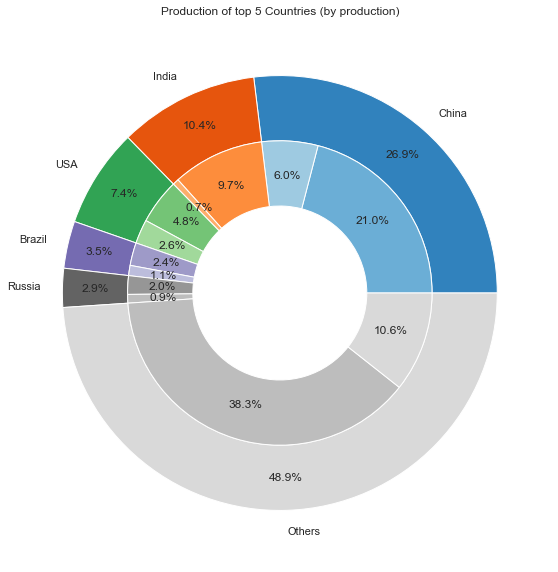

  Country    Y2013   percent         Food - Feed
0   China  3118296  0.269164   [2428001, 690295]
1   India  1204798  0.103995    [1129297, 75501]
2     USA   851978  0.073541    [555596, 296382]
3  Brazil   406360  0.035076    [280779, 125581]
4  Russia   334682  0.028889    [228324, 106358]
5  Others  5669019  0.025795  [4436671, 1232348]


In [52]:
#Preparing data to plot a pieplot with 2 dimensions.
# i want a dataset with "Area", "Element" and how much of that element they produce in 2013 (last year available).
a=FAO.groupby(["Area","Element"]).sum().index
b=FAO.groupby(["Area","Element"]).sum()['Y2013']
df=pd.DataFrame([a,b]).transpose()

df.rename(columns={0:"Country",1:"Y2013"},inplace=True)
df["Country"],df["Element"]=df.Country.str[0],df.Country.str[1]
df.set_index("Country",inplace=True)
#Creating a variable with production in percentage of the total production of 2013
df['percent']=((df["Y2013"]/df["Y2013"].sum()))

df.reset_index(inplace=True)

#creating a variable ("vals") that looks like this: [Food , Feed] in order to create the plot that i want
#taking inspiration from https://matplotlib.org/3.1.1/gallery/pie_and_polar_charts/nested_pie.html#sphx-glr-gallery-pie-and-polar-charts-nested-pie-py
c=0
lista=[]
for i in range(0,int(len(b)/2)):
    lista.append([b[c+1],b[c]])
    c +=2
#Now I don't need anymore having 2 row for each country (1 for food and 1 for feed), becasue i have this data on the new "vals" variable
df=df.groupby("Country").sum()
df['vals']=np.array(lista).tolist()
df.reset_index(inplace=True)
df=df.sort_values("Y2013",ascending=False)
# creating a copy in case i'll need this dataframe
df_copy=df

#Creating a copy that i will use to keep only the top5 countries that produce the most and aggregate others in one category ("Others")
df_top5=df
df_top5['Country'][len(df_top5)-1]="Others"
i = len(df_top5)-2
df_top5.reset_index(inplace=True,drop=True)
#print(df_top5)
vals = np.array(lista[::])
#print(vals)
while (i > 4):
    df_top5['Country'][i]="Others"
    df_top5['vals'][i]=df_top5['vals'][i]+df_top5['vals'][i+1]
    i = i-1
df_top5=df_top5[0:6]

valdf5a=0
valdf5b=0
#print(len(df_top5.vals[5]))
for i in range(0,len(df_top5.vals[5]),2):
    valdf5a=valdf5a+df_top5.vals[5][i]
    valdf5b=valdf5b+df_top5.vals[5][i+1]

df_top5.vals[5]=[valdf5a,valdf5b]

li=[]
for i in range(0,6):
    li.append([df_top5.vals[i][0],df_top5.vals[i][1]])
#print(li)

#plotting the piechart
fig, ax = plt.subplots(figsize=(10,10))


size = 0.3
vals = np.array(li[::])
#print(vals[0],vals[1],vals[0]+vals[1])
cmap = plt.get_cmap("tab20c")
outer_colors = cmap(np.arange(6)*4)
inner_colors = cmap(np.array([1, 2, 5, 6, 9, 10,13,14,17,18,18,19]))

#external pie
ax.pie(vals.sum(axis=1), radius=1, colors=outer_colors, labels=df_top5.Country,autopct='%1.1f%%',
       wedgeprops=dict(width=size, edgecolor='w'),pctdistance=0.85)
#internarl pie
ax.pie(vals.flatten(), radius=1-size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='w'),pctdistance=0.77,autopct='%1.1f%%')
ax.set(aspect="equal", title='Production of top 5 Countries (by production)')
plt.show()
df_top5.rename(columns = {"vals":"Food - Feed"}, inplace=True)
df_top5.drop(["Element"],axis=1,inplace=True)
for i in range(0,len(vals)):
    df_top5.Y2013[i]=vals[i].sum()
print(df_top5)

In this pie chart, we can observe how production is divided between countries (data referred to the year 2013).

We can see that the top 5 countries (by production) are responsible for 50% of total food+feed production. In particular, China produces 25.8% of the total, India 10.8%, and the USA 7.6%.
In the inner donut, we have each country slice dived into "food production" (the darker part)  and the "feed production" (lighter part).


In the table, we can read the precise data which is displayed. After the Country, the "Y2013" represents the total amount of food-feed production (in thousands of tons). This amount is divided into Food and Feed into the last columns. The "percent" columns indicate the % production of the total.
The feed production always represents between 31.6% and 7.4% of the total production.

### How does their production changed during years?

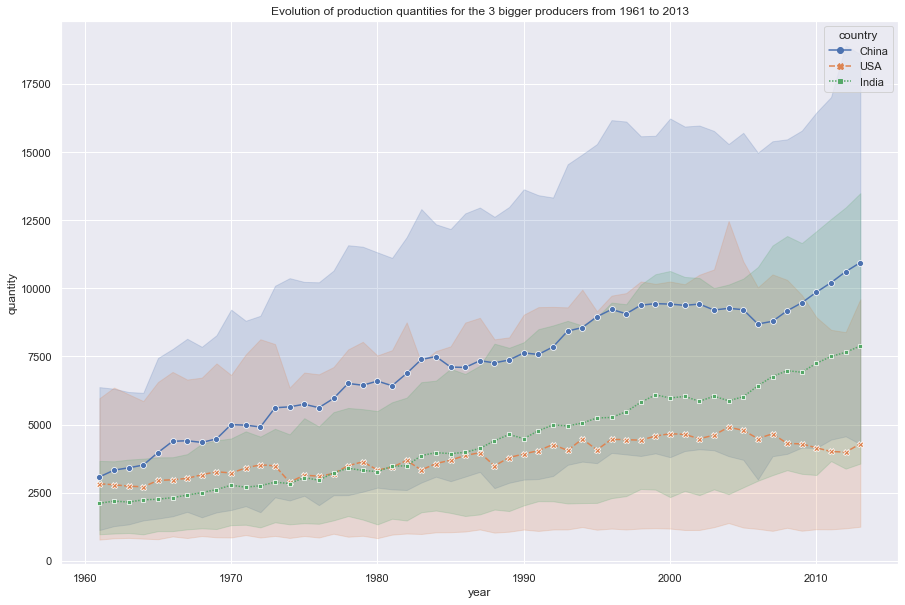

In [53]:
#Pivoting some columns
FAO1=FAO[FAO.columns[1:57]]
columns = [ 'Area', 'Item', 
           'Element']
#keeping only top3 countries
df =pd.melt(FAO1[(FAO1['Area']=='China')][1:57],id_vars= columns)
df=df.append(pd.melt(FAO1[(FAO1['Area']=='USA')][1:57],id_vars= columns))
df=df.append(pd.melt(FAO1[(FAO1['Area']=='India')][1:57],id_vars= columns))
# adjusting the dataset
df.rename(str.lower, axis = 1, inplace = True)
df.reset_index(drop=True, inplace=True)
df.rename({'variable':'year','value':'quantity','area':'country'},axis=1,inplace=True)
# Removing the Y from the numbers in df.year
df.year = df.year.str.replace('Y','')
df['year'] = pd.to_datetime(df['year'],infer_datetime_format=True)
df1 = df[(df['country']=='China')|(df['country']=='USA')|(df['country']=='India')][['item','element','year','quantity','country']]
#plotting
fig = plt.subplots(figsize=(15,10))
sns.lineplot(x='year', y='quantity', data=df1,hue='country',style='country',markers=True)
plt.title("Evolution of production quantities for the 3 bigger producers from 1961 to 2013")
plt.show()

From this graph, we can see how China has had a big growth in production. India has quadruplicated its production while the USA if has grown constantly hasn't even doubled its production.

Let's compare production to the population to understand if it could be the factor that led to that growth.

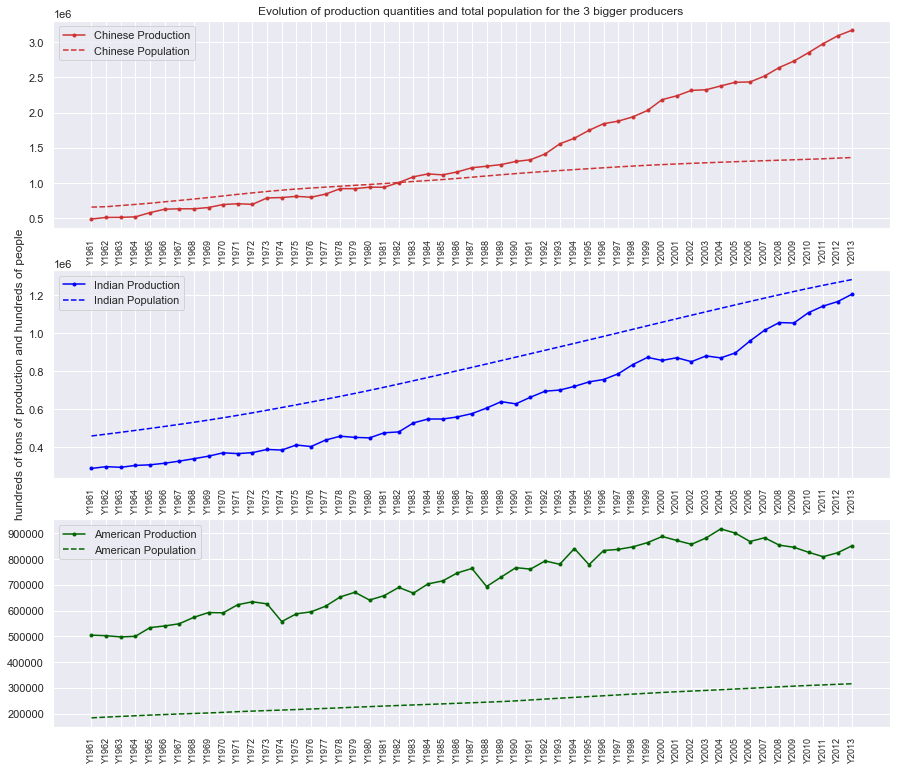

In [54]:
#preparing a new dataset with top 3 countries on which join population data
top3=FAO.groupby("Area_Abbreviation").sum("Y2013")
top3.sort_values("Y2013", ascending= False, inplace=True)
top3=top3[0:3]
#print(top3.index[top3.index=="CHN"])
top3p=pd.DataFrame(index=top3.index,columns=POP.columns)
# joining population data
for f in top3.index:
    top3p[top3.index==f]=(POP[POP.index==f])
top3p.drop(columns=["Country_Name","1960","2014","2015","2016","2017","2018","2019","2020"],inplace=True)
#separating dataframes by countries in order to make it easier to plot
top3china=pd.DataFrame({"year":np.array(top3[top3.index=="CHN"].columns), "production":np.array(top3[top3.index=="CHN"])[0],"population":np.array(top3p[top3p.index=="CHN"])[0]/1000})
top3india=pd.DataFrame({"year":np.array(top3[top3.index=="IND"].columns), "production":np.array(top3[top3.index=="IND"])[0],"population":np.array(top3p[top3p.index=="IND"])[0]/1000})
top3usa=pd.DataFrame({"year":np.array(top3[top3.index=="USA"].columns), "production":np.array(top3[top3.index=="USA"])[0],"population":np.array(top3p[top3p.index=="USA"])[0]/1000})

#plotting

fig = plt.figure(figsize=(15,13))

ax1 = fig.add_subplot(3,1,1)
ax1.plot(top3china.year, top3china.production,label="Chinese Production", color="#CD3333",marker='.')
ax1.plot('year', 'population', data=top3china,label="Chinese Population", color="#CD3333",linestyle='dashed')
plt.title("Evolution of production quantities and total population for the 3 bigger producers ")
plt.xticks(rotation = 90, size=9)
plt.legend()

ax2 = fig.add_subplot(3,1,2)
ax2.plot('year', 'production', data=top3india,label="Indian Production", color="#0000FF",marker='.')
ax2.plot('year', 'population', data=top3india,label="Indian Population", color="#0000FF",linestyle='dashed')
plt.ylabel("hundreds of tons of production and hundreds of people")
plt.xticks(rotation = 90, size=9)
plt.legend()

ax3 = fig.add_subplot(3,1,3)
ax3.plot('year', 'production', data=top3usa,label="American Production", color="#006400",marker='.')
ax3.plot('year', 'population', data=top3usa,label="American Population", color="#006400",linestyle='dashed')
plt.xticks(rotation = 90, size=9)
plt.legend()
plt.show()

We can observe how the United States of America (green lines) started with a production ratio pro capita (tons per person) > 1, but looks to remain constant over the years, while China and India had a big growth.

In particular, China reaches the equivalence between 1 ton of product per habitant in 1982 and India in 2010.

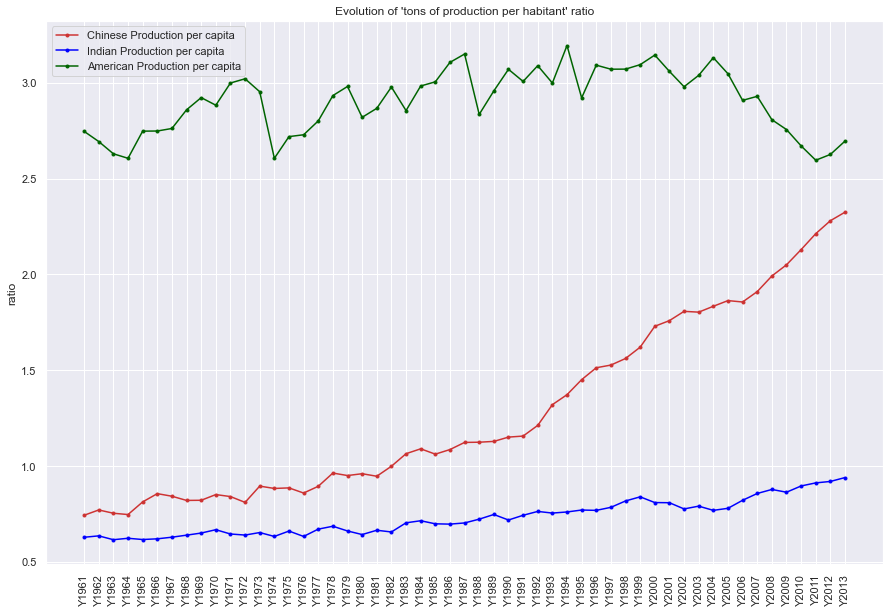

In [55]:
#plotting the ratio between production and population
fig= plt.subplots(figsize=(15,10))
plt.plot(top3china.year, top3china.production/top3china.population ,label="Chinese Production per capita", color="#CD3333",marker='.')
plt.plot(top3india.year, top3india.production/top3india.population ,label="Indian Production per capita", color="#0000FF",marker='.')
plt.plot(top3usa.year, top3usa.production/top3usa.population ,label="American Production per capita", color="#006400",marker='.')
plt.xticks(rotation = 90)
plt.legend()
plt.title("Evolution of 'tons of production per habitant' ratio")
plt.ylabel("ratio")
plt.show()

In this graph, we had confirmation about previous observations, but we can also notice that even with this incredible growth of Chinese production, the ratio per capita is still lower than the American one.

Now let's have a look atthe aggregated data for all countries.

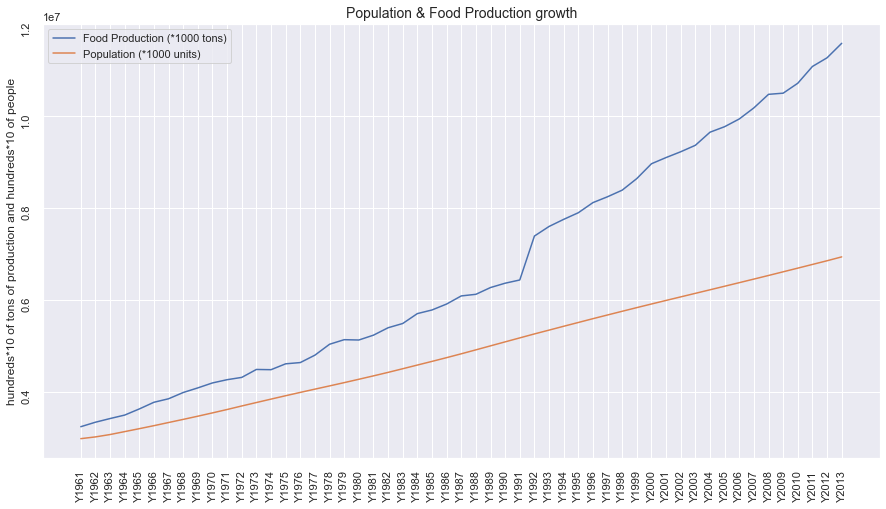

In [56]:
#plotting data for all the countries 
sns.set_theme(style="darkgrid")
fig, ax = plt.subplots(figsize=(15,8))
# Plot the responses for different events and regions
d={"year":np.array(FAO.sum()[4::].index),"Food_Production":FAO.sum()[4::].values, "Population":POP.sum()[1:54:].values[0:len(POP.sum()[1::].values)]/1000}
df=pd.DataFrame(d)

plt.plot(df.year, df.Food_Production, label = "Food Production (*1000 tons)")
plt.plot(df.year, df.Population, label = "Population (*1000 units)" )
plt.title("Population & Food Production growth", fontsize=14)
ax.tick_params(rotation = 90, size=8)

plt.legend()
plt.ylabel("hundreds*10 of tons of production and hundreds*10 of people")

plt.show()



In this graph, we can see a more generic view of the comparison of production and population growth. We observe that production grows faster than the population. It can be because we produce more food or because we produce more feed. Let's see.
I look for information about the strange growth of 1991 and 1992 and I find out that in the 90s GMO studies and discoveries started. Anyways I don't think this is the reason because the growth should have persisted with a similar slope for more years.

Let's also look at the difference in the growth of the Food versus the Feed production

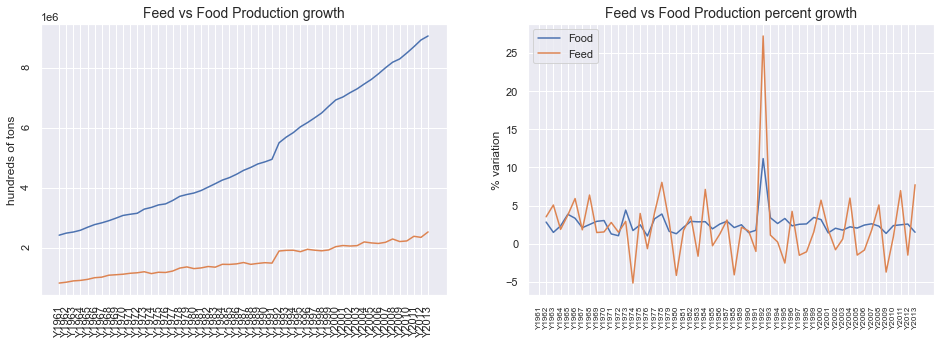

Element       Food_percent  Feed_percent
Element                                 
Food_percent      1.000000      0.739018
Feed_percent      0.739018      1.000000


In [57]:
# Comparing Food and Feed production during years
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,5))

# lineplot with absolut values of production
ax1.plot(FAO_foodvsfeed.index, FAO_foodvsfeed.Food, label = "Food ")
ax1.plot(FAO_foodvsfeed.index, FAO_foodvsfeed.Feed, label = "Feed" )
ax1.set_title("Feed vs Food Production growth", fontsize=14)
ax1.tick_params(rotation = 90, size=6)
ax1.set_ylabel("hundreds of tons")

# lineplot with percentage difference from previous year
ax2.plot(FAO_foodvsfeed.index, FAO_foodvsfeed.Food_percent, label = "Food")
ax2.plot(FAO_foodvsfeed.index, FAO_foodvsfeed.Feed_percent, label = "Feed" )
ax2.set_title("Feed vs Food Production percent growth", fontsize=14)
plt.xticks(rotation = 90,fontsize=8)
plt.ylabel("% variation")
plt.legend(loc='upper left')
plt.show()
print(FAO_foodvsfeed.corr())

Those plots represent a comparison between food vs feed production during years (in the right plot there is the % variation to the previous year). We can only see how the growth is heavily correlated and none of the 2 looks to have a bigger growth.
After the plots, we can see the correlation matrix that shows a linear correlation of the 76%.

### What does they produce most?

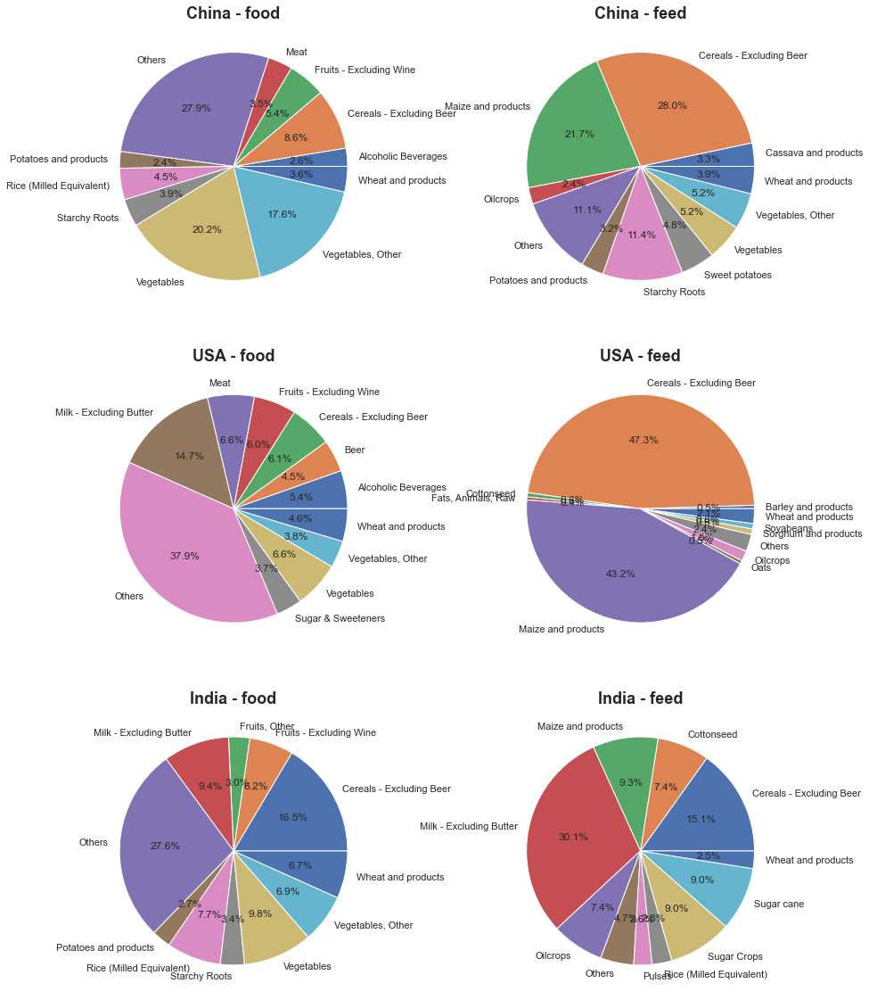

In [58]:
#Creating the dataset to plot data about what biggest producers produce most
FAO2=FAO[FAO.columns[[1,2,3,56]]]

#Creating a dataframe with Chinese data
dfC = FAO2[(FAO2['Area']=='China')][['Item','Element','Y2013','Area']]
dfCfood=dfC[dfC.Element=="Food"]
#print(dfCfood)
dfCfood.reset_index(inplace=True, drop=True)
#print(dfCfood)
dfCfeed=dfC[dfC.Element=="Feed"]
dfCfeed.reset_index(inplace=True, drop=True)
dfCfood.sort_values("Y2013", inplace=True)
#aggregatin items not in the top 10 for quantities in an "Others" category
dfCfood.Item[0:-10]="Others"
dfCfeed.sort_values("Y2013", inplace=True)
dfCfeed.Item[0:-10]="Others"
dfCfood=dfCfood.groupby("Item").sum()
dfCfeed=dfCfeed.groupby("Item").sum()

#Creating a dataframe with American data
dfU = FAO2[(FAO2['Area']=='USA')][['Item','Element','Y2013','Area']]
dfUfood=dfU[dfU.Element=="Food"]
dfUfood.reset_index(inplace=True, drop=True)
dfUfeed=dfU[dfU.Element=="Feed"]
dfUfeed.reset_index(inplace=True, drop=True)
dfUfood.sort_values("Y2013", inplace=True)
#aggregatin items not in the top 10 for quantities in an "Others" category
dfUfood.Item[0:-10]="Others"
dfUfeed.sort_values("Y2013", inplace=True)
dfUfeed.Item[0:-10]="Others"
dfUfood=dfUfood.groupby("Item").sum()
dfUfeed=dfUfeed.groupby("Item").sum()

#Creating a dataframe with Indian data
dfI = FAO2[(FAO2['Area']=='India')][['Item','Element','Y2013','Area']]
dfIfood=dfI[dfI.Element=="Food"]
dfIfood.reset_index(inplace=True, drop=True)
dfIfeed=dfI[dfI.Element=="Feed"]
dfIfeed.reset_index(inplace=True, drop=True)
dfIfood.sort_values("Y2013", inplace=True)
#aggregatin items not in the top 10 for quantities in an "Others" category
dfIfood.Item[0:-10]="Others"
dfIfeed.sort_values("Y2013", inplace=True)
dfIfeed.Item[0:-10]="Others"
dfIfood=dfIfood.groupby("Item").sum()
dfIfeed=dfIfeed.groupby("Item").sum()
#print(dfIfood)

#plotting 2 piecharts for each country. One with food products, one with feed products.
fig = plt.figure(figsize=(15,20))
x = np.arange(0, len(dfI.index))

ax1 = fig.add_subplot(3,2,1)
ax1.pie("Y2013", data=dfCfood,labels=dfCfood.index,autopct='%1.1f%%')
plt.title('China - food',fontsize = 18, fontweight = "bold")

ax2 = fig.add_subplot(3,2,2)
ax2.pie("Y2013", data=dfCfeed,labels=dfCfeed.index,autopct='%1.1f%%')
plt.title('China - feed',fontsize = 18, fontweight = "bold")


ax3 = fig.add_subplot(3,2,3)
ax3.pie( "Y2013", data=dfUfood,labels=dfUfood.index,autopct='%1.1f%%')
plt.title('USA - food',fontsize = 18, fontweight = "bold")

ax4 = fig.add_subplot(3,2,4)
ax4.pie( "Y2013", data=dfUfeed,labels=dfUfeed.index,autopct='%1.1f%%')
plt.title('USA - feed',fontsize = 18, fontweight = "bold")

ax5 = fig.add_subplot(3,2,5)
ax5.pie( "Y2013", data=dfIfood,labels=dfIfood.index,autopct='%1.1f%%')
plt.title('India - food',fontsize = 18, fontweight = "bold")

ax6 = fig.add_subplot(3,2,6)
ax6.pie( "Y2013", data=dfIfeed,labels=dfIfeed.index,autopct='%1.1f%%')
plt.title('India - feed',fontsize = 18, fontweight = "bold")

plt.show()

What we observe:

China's food production is represented by almost 40% by vegetables while Feed production is almost a half represented by Maize (and products) and Cereals (excluding Beer).

American food production is very diversified. Milk products (except butter) represent 14.7% and are the bigger slice of the pie (not counting "Others"). Feed production is represented by Maize (and products) and Cereals (excluding Beer) for 90%.

Indian food production is diversified while for Feed production we can notice a big slice representing Milk (excluding butter) that represents the 30% of the total feed production.

It is interesting to notice that for China Meat production represents 3.5% while for the USA it is 6.6%, so almost double, (and for India is not even in the top10 - so is less than 2.7% ). Another thing to notice is that in both USA and China, alcoholic beverages are in the top 10 most produced food items.

Now let's look at the evolution of the production of those products to see if there is something interesting to see.

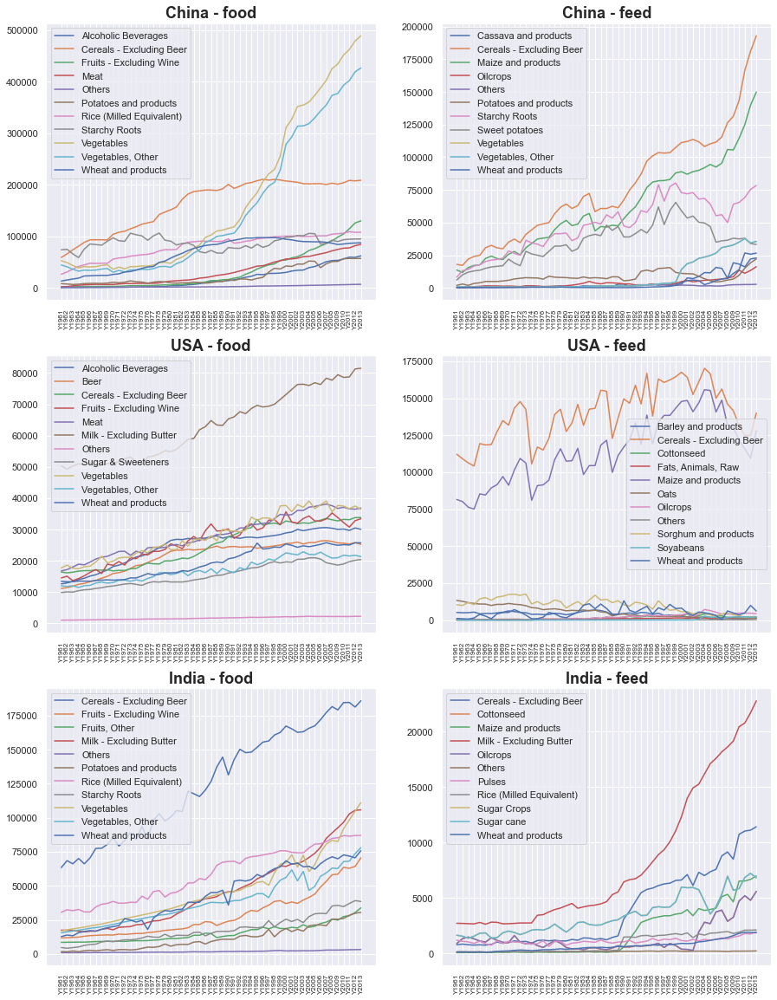

In [59]:
#Creating the datasets. One for each country and each type of product (food or feed). The 10 products are choosen from the top10 of the 2013
FAO2=FAO[FAO.columns[[range(1,57)]]]

#China
dfC = FAO2[(FAO2['Area']=='China')]

dfCfood=dfC[dfC.Element=="Food"]
dfCfood.reset_index(inplace=True,drop=True)
dfCfood.sort_values("Y2013", inplace=True)
dfCfood.Item[0:-10]="Others"
dfCfood=dfCfood.groupby("Item").mean()
dfCfood.reset_index(inplace=True)


dfCfeed=dfC[dfC.Element=="Feed"]
dfCfeed.reset_index(inplace=True,drop=True)
dfCfeed.sort_values("Y2013", inplace=True)
dfCfeed.Item[0:-10]="Others"
dfCfeed=dfCfeed.groupby("Item").mean()
dfCfeed.reset_index(inplace=True)

#USA
dfU = FAO2[(FAO2['Area']=="USA")]

dfUfood=dfU[dfU.Element=="Food"]
dfUfood.reset_index(inplace=True,drop=True)
dfUfood.sort_values("Y2013", inplace=True)
dfUfood.Item[0:-10]="Others"
dfUfood=dfUfood.groupby("Item").mean()
dfUfood.reset_index(inplace=True)

dfUfeed=dfU[dfU.Element=="Feed"]
dfUfeed.reset_index(inplace=True,drop=True)
dfUfeed.sort_values("Y2013", inplace=True)
dfUfeed.Item[0:-10]="Others"
dfUfeed=dfUfeed.groupby("Item").mean()
dfUfeed.reset_index(inplace=True)

#India
dfI = FAO2[(FAO2['Area']=='India')]

dfIfood=dfI[dfI.Element=="Food"]
dfIfood.reset_index(inplace=True,drop=True)
dfIfood.sort_values("Y2013", inplace=True)
dfIfood.Item[0:-10]="Others"
dfIfood=dfIfood.groupby("Item").mean()
dfIfood.reset_index(inplace=True)

dfIfeed=dfI[dfI.Element=="Feed"]
dfIfeed.reset_index(inplace=True,drop=True)
dfIfeed.sort_values("Y2013", inplace=True)
dfIfeed.Item[0:-10]="Others"
dfIfeed=dfIfeed.groupby("Item").mean()
dfIfeed.reset_index(inplace=True)
#print(dfCfood.loc[0,].Item)
fig = plt.figure(figsize=(15,20))

ax1= fig.add_subplot(3,2,1)
for i in range(0,len(dfCfood)):
    ax1.plot(dfCfood.loc[i,][1::].index, dfCfood.loc[i,][1::].values ,label=dfCfood.loc[i,].Item)
plt.legend()
plt.title('China - food',fontsize = 18, fontweight = "bold")
plt.xticks(rotation=90, size=8)


ax2= fig.add_subplot(3,2,2)
for i in range(0,len(dfCfeed)):
    ax2.plot(dfCfeed.loc[i,][1::].index, dfCfeed.loc[i,][1::].values ,label=dfCfeed.loc[i,].Item)
plt.legend()
plt.title('China - feed',fontsize = 18, fontweight = "bold")
plt.xticks(rotation=90, size=8)

ax3= fig.add_subplot(3,2,3)
for i in range(0,len(dfUfood)):
    ax3.plot(dfUfood.loc[i,][1::].index, dfUfood.loc[i,][1::].values ,label=dfUfood.loc[i,].Item)
plt.legend()
plt.title('USA - food',fontsize = 18, fontweight = "bold")
plt.xticks(rotation=90, size=8)


ax4= fig.add_subplot(3,2,4)
for i in range(0,len(dfUfeed)):
    ax4.plot(dfUfeed.loc[i,][1::].index, dfUfeed.loc[i,][1::].values ,label=dfUfeed.loc[i,].Item)
plt.legend()
plt.title('USA - feed',fontsize = 18, fontweight = "bold")
plt.xticks(rotation=90, size=8)

ax5= fig.add_subplot(3,2,5)
for i in range(0,len(dfIfood)):
    ax5.plot(dfIfood.loc[i,][1::].index, dfIfood.loc[i,][1::].values ,label=dfIfood.loc[i,].Item)
plt.legend()
plt.title('India - food',fontsize = 18, fontweight = "bold")
plt.xticks(rotation=90, size=8)


ax6= fig.add_subplot(3,2,6)
for i in range(0,len(dfIfeed)):
    ax6.plot(dfIfeed.loc[i,][1::].index, dfIfeed.loc[i,][1::].values ,label=dfIfeed.loc[i,].Item)
plt.legend()
plt.title('India - feed',fontsize = 18, fontweight = "bold")
plt.xticks(rotation=90, size=8)

plt.show()

For China, we see that in general food production has been growing, but especially vegetable production started running up in the 80s and is still going. For Feed production, we can see that Sweet potatoes are going against the trend while Cereals and Maize are growing fast.

For the USA's food production no item goes out of the trend. We can see that milk production is more than 2 times the second most produced food item. The feed production as previously seen on piecharts is dominated by 2 items. Nice to notice how other feed items have had a decreasing production.

Indian food production sees regular growth. For the feed production, we can see that from 90s growth increased.

### Which items are the most produced?

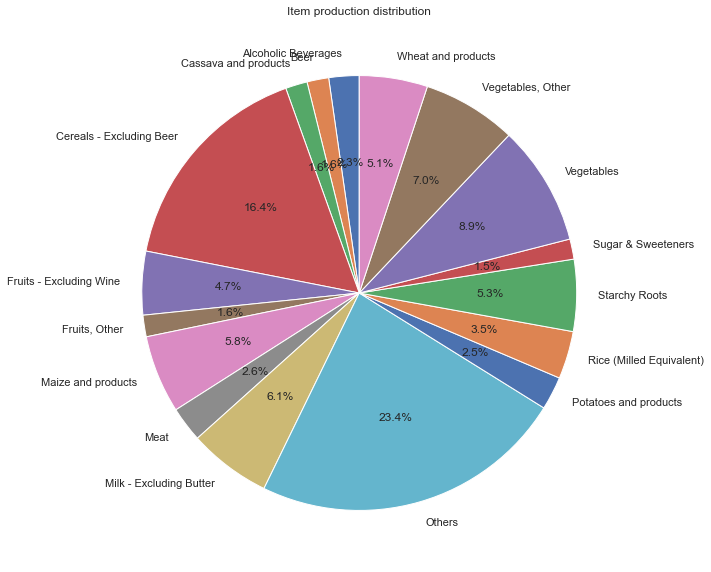

In [60]:
# Start looking at the third dataset

#creating the table to plot data
a=FAO.groupby("Item").sum().index
b=FAO.groupby("Item").sum()['Y2013']
df=pd.DataFrame([a,b]).transpose()
df.rename(columns={0:"Item",1:"Y2013"},inplace=True)
df.set_index("Item",inplace=True)
df['percent']=((df["Y2013"]/df["Y2013"].sum()))

df.sort_values("Y2013",ascending=False, inplace=True)

#keeping only top 15 products and aggregating other to one category
df_top=df
df_top.reset_index(inplace=True)
i = len(df_top)
while (i > 15):
    df_top.Item[i]="Others"
    i = i-1
#plotting
fig = plt.figure(figsize = (20,10))
plt.pie("percent", data=df_top.groupby("Item").sum(), autopct='%1.1f%%', labels = df_top.groupby("Item").sum().index,startangle=90)
plt.title("Item production distribution")
plt.show()


In the piechart, we can see how much each item represents of the total production. We can see the detail of only the top 15 items; the other part is aggregated with the sum under the "Others" category. 
Products have a heterogeneous production. Only the Cereals category looks to be way bigger than the others.

### How does their production changed during years?

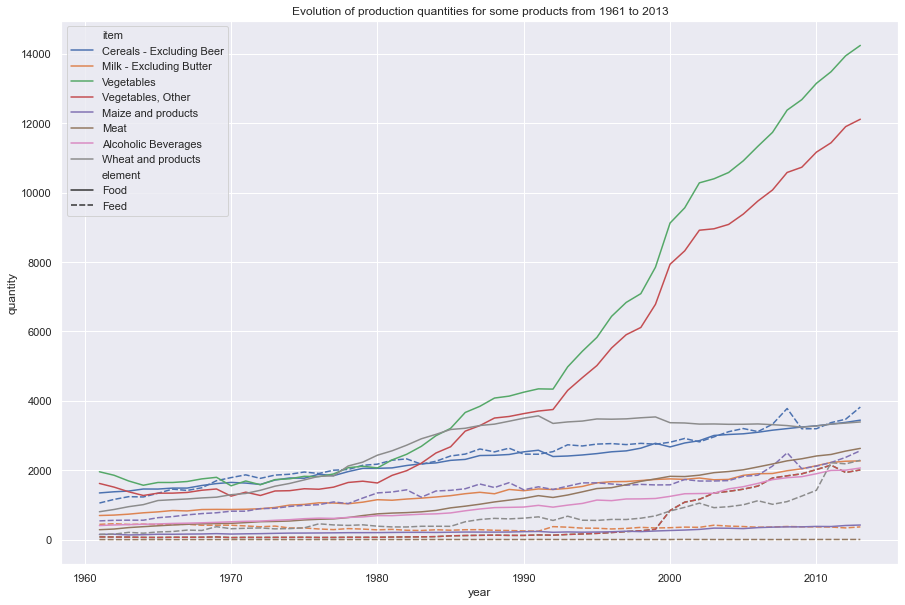

In [61]:
#Pivoting some columns
FAO1=FAO[FAO.columns[1:57]]
#print(FAO1)
columns = [ 'Area', 'Item', 
           'Element']
df =pd.melt(FAO1[(FAO1['Item']=='Cereals - Excluding Beer')][1:57],id_vars= columns)
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Milk - Excluding Butter')][1:57],id_vars= columns))
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Vegetables')][1:57],id_vars= columns))
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Vegetables, Other')][1:57],id_vars= columns))
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Maize and products')][1:57],id_vars= columns))
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Meat')][1:57],id_vars= columns))
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Alcoholic Beverages')][1:57],id_vars= columns))
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Fruit - Excluding Wine')][1:57],id_vars= columns))
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Wheat and products')][1:57],id_vars= columns))


df.rename(str.lower, axis = 1, inplace = True)
df.reset_index(drop=True, inplace=True)
df.rename({'variable':'year','value':'quantity','area':'country'},axis=1,inplace=True)

# Removing the Y from the numbers in df.year
df.year = df.year.str.replace('Y','')
df['year'] = pd.to_datetime(df['year'],infer_datetime_format=True)
df1 = df[(df['item']=='Cereals - Excluding Beer')|(df['item']=='Milk - Excluding Butter')|(df['item']=='Vegetables')|(df['item']=='Vegetables, Other')|(df['item']=='Maize and products')|(df['item']=='Starchy Roots')|(df['item']=='Wheat and products')|(df['item']=='Fruit - Excluding Wine')|(df['item']=='Meat')|(df['item']=='Alcoholic Beverages')][['item','element','year','quantity','country']]
fig = plt.subplots(figsize=(15,10))
ax=sns.lineplot(x=df1.year, y=df1.quantity, hue=df1.item, style=df1.element,markers=False, ci=None).invert_yaxis()#Passing the entire dataset in long-form mode will aggregate over repeated values (each year) to show the mean and 95% confidence interval
plt.legend(loc="upper left")
plt.title("Evolution of production quantities for some products from 1961 to 2013")
plt.show()

Most increased in absolute quantities are vegetables, but let's see in percentages... Not continuous lines represent feed and are interesting to notice how "Vegetable, Other" has grown since 2000. Alcoholic Beverages and Meat saw constant growth.

In [62]:
#Creating new dataframe
df= df.groupby(["item","year","element"]).sum()
df.reset_index(inplace=True)
df["percent"]=df.quantity

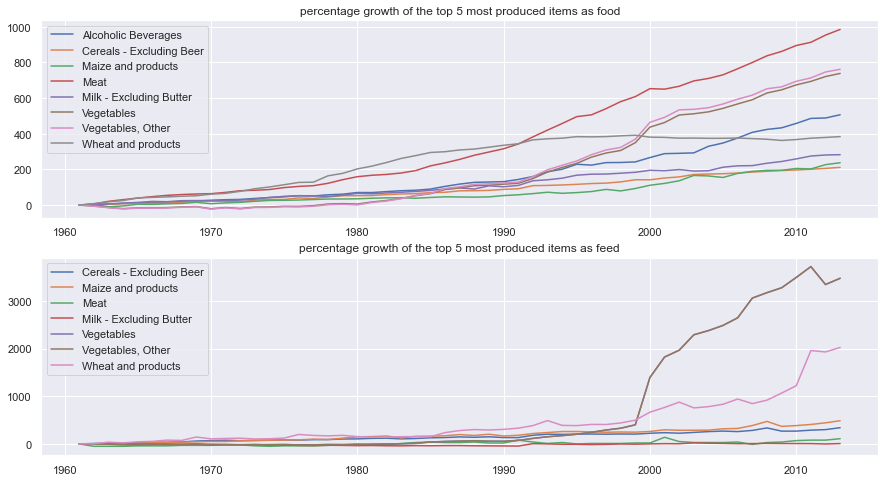

In [63]:
#continuing with preparation of the data. I separate block in order to make this one repetable.
#By keeping the last block of code with this one I would not be able to run this block twice without getting an error

#Creating different dataframes for food and for feed
dfFood=df[df.element=="Food"]        
dfFeed=df[df.element=="Feed"]        
dfFood=dfFood.groupby(["item","year"]).sum()
dfFeed=dfFeed.groupby(["item","year"]).sum()

dfFood.reset_index(inplace=True)
dfFood.percent=dfFood.percent.astype("float")
#creating a variable with the percentage growth from the first period 
for items in dfFood.item.unique():
    sub=dfFood[dfFood.item==items]
    sub.reset_index(inplace=True,drop=False)
    for i in range(0,len(sub)-1):
        sub.percent[0]=0
        sub.percent[i+1]=((sub.quantity[i+1]-sub.quantity[0])/sub.quantity[0])*100
    sub.rename(columns={"index":"oldindex"}, inplace=True)
    sub.set_index("oldindex", inplace=True,drop=True)
    #print(sub)
    dfFood[dfFood.item==items]=sub

#repeating same code for the feed dataframe
dfFeed.reset_index(inplace=True)
dfFeed.percent=dfFeed.percent.astype("float")
for items in dfFeed.item.unique():
    sub=dfFeed[dfFeed.item==items]
    sub.reset_index(inplace=True,drop=False)
    for i in range(0,len(sub)-1):
        sub.percent[0]=0
        sub.percent[i+1]=((sub.quantity[i+1]-sub.quantity[0])/sub.quantity[0])*100
    sub.rename(columns={"index":"oldindex"}, inplace=True)
    sub.set_index("oldindex", inplace=True,drop=True)
    dfFeed[dfFeed.item==items]=sub

#plotting
fig = plt.figure(figsize=(15,8))

ax1= fig.add_subplot(2,1,1)
for items in dfFood.item.unique():
    ax1.plot(dfFood[dfFood.item==items].year.dt.year, dfFood[dfFood.item==items].percent, label=dfFood[dfFood.item==items].item.unique()[0])
plt.title("percentage growth of the top 5 most produced items as food")
plt.legend()

ax2= fig.add_subplot(2,1,2)
for items in dfFeed.item.unique():
    ax2.plot(dfFeed[dfFeed.item==items].year.dt.year, dfFeed[dfFeed.item==items].percent, label=dfFeed[dfFeed.item==items].item.unique()[0])
plt.title("percentage growth of the top 5 most produced items as feed")
plt.legend()

plt.show()

From the food production, we see how Cereals who seemed to have had great growth, actually did not have it compared to others. 

From the feed production, we can better appreciate the growth from the 2000s. Also Wheat saw great growth during the last years.

### Which countries produce more of those items?

In [64]:
from IPython.display import display
#Preparing data
FAO1=FAO[FAO.columns[[1,2,3,56]]]
#print(FAO1.Area.unique())
columns = [ 'Area', 'Item', 'Element']
df =pd.melt(FAO1[(FAO1['Item']=='Cereals - Excluding Beer')],id_vars= columns)
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Milk - Excluding Butter')],id_vars= columns))
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Vegetables')],id_vars= columns))
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Vegetables, Other')],id_vars= columns))
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Maize and products')],id_vars= columns))
df=df.append(pd.melt(FAO1[(FAO1['Item']=='Starchy Roots')],id_vars= columns))
df=df.groupby(["Item","Area","Element"]).sum()
df.reset_index(inplace=True)
#printing best 5 producers for each item in the top 6 items (food + feed)
for elemento in df.Element.unique():
    for item in df.Item.unique():
        print("Top 5 producers of "+ item +" as "+ elemento + " are:")
        display(pd.DataFrame(df[df.Element==elemento][df.Item==item].sort_values("value",ascending=False).Area[0:5].reset_index(drop=True)))
        

Top 5 producers of Cereals - Excluding Beer as Feed are:


,Area
0,China
1,USA
2,Brazil
3,Russia
4,Germany


Top 5 producers of Maize and products as Feed are:


,Area
0,China
1,USA
2,Brazil
3,Mexico
4,Ukraine


Top 5 producers of Milk - Excluding Butter as Feed are:


,Area
0,India
1,Russia
2,Uzbekistan
3,Ukraine
4,Turkey


Top 5 producers of Starchy Roots as Feed are:


,Area
0,China
1,Nigeria
2,Brazil
3,Angola
4,Ukraine


Top 5 producers of Vegetables as Feed are:


,Area
0,China
1,Turkey
2,Russia
3,Ukraine
4,Kazakhstan


Top 5 producers of Vegetables, Other as Feed are:


,Area
0,China
1,Russia
2,Ukraine
3,Turkey
4,Kazakhstan


Top 5 producers of Cereals - Excluding Beer as Food are:


,Area
0,China
1,India
2,Indonesia
3,USA
4,Bangladesh


Top 5 producers of Maize and products as Food are:


,Area
0,Mexico
1,China
2,Indonesia
3,India
4,Nigeria


Top 5 producers of Milk - Excluding Butter as Food are:


,Area
0,India
1,USA
2,China
3,Pakistan
4,Brazil


Top 5 producers of Starchy Roots as Food are:


,Area
0,China
1,Nigeria
2,India
3,USA
4,Russia


Top 5 producers of Vegetables as Food are:


,Area
0,China
1,India
2,USA
3,Iran
4,Turkey


Top 5 producers of Vegetables, Other as Food are:


,Area
0,China
1,India
2,USA
3,Iran
4,Viet Nam


### Which items produce more pollution?

In [65]:
#Checking if it is possible to joing FAO dataset with the FoodProduction one.
count=0
for item in FoodProduction.index:
    #print(item, item in FAO.Item.unique())
    if item in FAO.Item.unique():
        count +=1
print("Items that has the same name in the 2 given datasets are " +  str(count))

Items that has the same name in the 2 given datasets are 7


We only have 7 matching items in the 2 datasets so it will not make sense to combine them.

In [69]:
#Create a table to define products by the 3 categories "vegan", "vegetarian" and "meat"
origin=pd.DataFrame()
origin["item"]=FoodProduction.index
origin["origin"]=["Vegan","Vegan","Vegan","Vegan","Vegan",
                 "Vegan","Vegan","Vegan","Vegan",
                 "Vegan","Vegan","Vegan","Vegan",
                 "Vegan","Vegan","Vegan","Vegan",
                 "Vegan","Vegan","Vegan","Vegan",
                 "Vegan","Vegan","Vegan","Vegetarian",
                 "Vegan","Vegan","Vegan","Vegan",
                 "Vegetarian","Meat","Vegan","Vegan",
                 "Meat","Meat","Vegan","Meat",
                 "Vegan","Vegan","Meat","Vegetarian",
                 "Meat","Meat"]
origin["score"]=([0,0,0,0,0,
                 0,0,0,0,
                 0,0,0,0,
                 0,0,0,0,
                 0,0,0,0,
                 0,0,0,1,
                 0,0,0,0,
                 1,2,0,0,
                 2,2,0,2,
                 0,0,2,1,
                 2,2])
origin.set_index("item",inplace=True,drop=True)
#print(origin)

In [70]:
FoodProduction=FoodProduction.join(origin,on=FoodProduction.index, how="left")
#print(FoodProduction)

FoodProduction["colori"]=FoodProduction.origin
for i,en in enumerate(FoodProduction.origin):
    if en=="Vegan":
        FoodProduction.colori[i]="green"
    elif en=="Vegetarian":
        FoodProduction.colori[i]="limegreen"
    else:
        FoodProduction.colori[i]="red"

ValueError: columns overlap but no suffix specified: Index(['origin', 'score'], dtype='object')

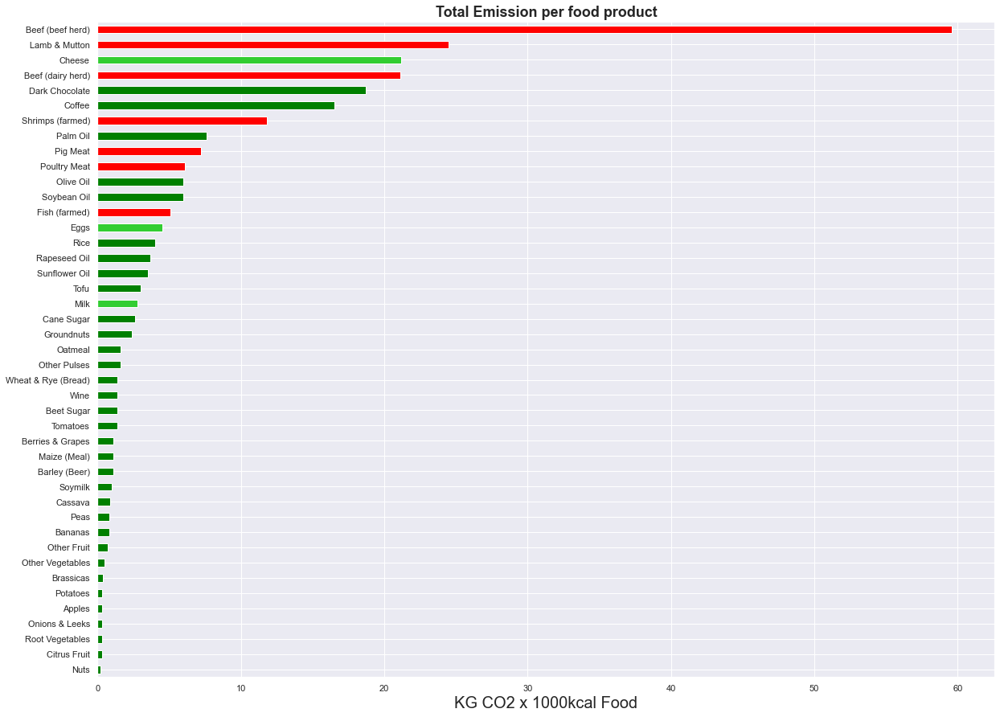

In [71]:
#Checking Total emission for each item
FoodProduction=FoodProduction.sort_values(['Total_emissions'])

plt.subplots(figsize = (20,15))

FoodProduction.Total_emissions.plot(kind = 'barh',color=FoodProduction.sort_values("Total_emissions").colori)

plt.title('Total Emission per food product',fontsize = 18, fontweight = "bold")
plt.xlabel('KG CO2 x 1000kcal Food',fontsize = 20)
plt.ylabel('')

plt.show()

Is quite easy to see that food coming from animals is in the top position.

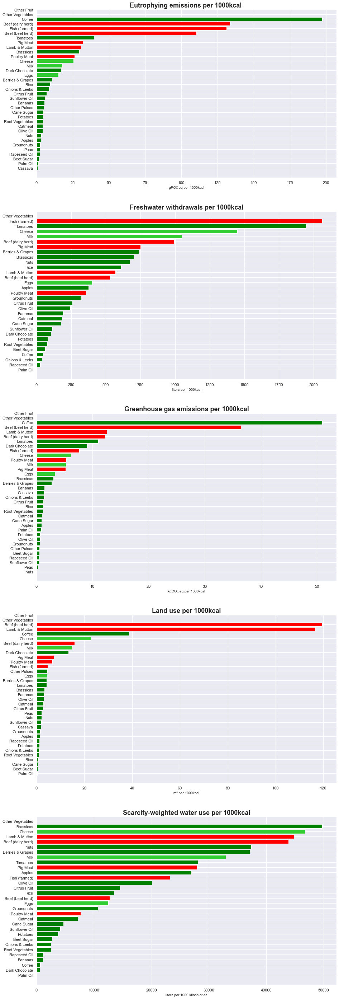

In [30]:
fig = plt.figure(figsize=(15,50))

ax1= fig.add_subplot(5,1,1)
ax1.barh(FoodProduction.sort_values("EutrophyingEmissions").index,FoodProduction.EutrophyingEmissions.sort_values(),color=FoodProduction.sort_values("EutrophyingEmissions").colori)
plt.title('Eutrophying emissions per 1000kcal ',fontsize = 18, fontweight = "bold")
plt.xlabel('gPO₄eq per 1000kcal',fontsize = 10)
plt.ylabel('')

ax2= fig.add_subplot(5,1,2)
ax2.barh(FoodProduction.sort_values("FreshwaterWithdrawals").index,FoodProduction.FreshwaterWithdrawals.sort_values(),color=FoodProduction.sort_values("FreshwaterWithdrawals").colori)
plt.title('Freshwater withdrawals per 1000kcal',fontsize = 18, fontweight = "bold")
plt.xlabel('liters per 1000kcal',fontsize = 10)
plt.ylabel('')

ax3= fig.add_subplot(5,1,3)
ax3.barh(FoodProduction.sort_values("GreenhouseGasEmissions").index,FoodProduction.GreenhouseGasEmissions.sort_values(),color=FoodProduction.sort_values("GreenhouseGasEmissions").colori)
plt.title('Greenhouse gas emissions per 1000kcal',fontsize = 18, fontweight = "bold")
plt.xlabel('kgCO₂eq per 1000kcal',fontsize = 10)
plt.ylabel('')

ax4= fig.add_subplot(5,1,4)
ax4.barh(FoodProduction.sort_values("LandUse").index,FoodProduction.LandUse.sort_values(),color=FoodProduction.sort_values("LandUse").colori)
plt.title('Land use per 1000kcal',fontsize = 18, fontweight = "bold")
plt.xlabel('m² per 1000kcal',fontsize = 10)
plt.ylabel('')

ax5= fig.add_subplot(5,1,5)
ax5.barh(FoodProduction.sort_values("ScarcityWeightedWaterUse").index,FoodProduction.ScarcityWeightedWaterUse.sort_values(),color=FoodProduction.sort_values("ScarcityWeightedWaterUse").colori)
plt.title('Scarcity-weighted water use per 1000kcal',fontsize = 18, fontweight = "bold")
plt.xlabel('liters per 1000 kilocalories',fontsize = 10)
plt.ylabel('')

plt.show()

From this graph, we can notice that Animal products, in red, tend to pollute more than vegetarian (light green) and vegan items.

In [72]:
#Preparing data for the next plot
da=pd.DataFrame()
da["Animal Feed"]=(FoodProduction["Animal Feed"]/FoodProduction["Animal Feed"].sum())
da["Farm"]=(FoodProduction["Farm"]/FoodProduction["Farm"].sum())
da["Processing"]=(FoodProduction["Processing"]/FoodProduction["Processing"].sum())
da["Transport"]=(FoodProduction["Transport"]/FoodProduction["Transport"].sum())
da["Packging"]=(FoodProduction["Packging"]/FoodProduction["Packging"].sum())
da["Retail"]=(FoodProduction["Retail"]/FoodProduction["Retail"].sum())
da["rank"]=FoodProduction["rank"]
#da["Total_emissions"]=(FoodProduction["Total_emissions"]/FoodProduction["Total_emissions"].sum())*100

# Fuction that normalize the data by converting values in range [0,1]
def PercentageOfTotalForThisItem(data):
    return (data) / data.sum()

# Define the colors palette to be used on pie charts
colors = sns.color_palette('colorblind')#[0:7]

# Workaround to insert labels into a LEGEND and not on the pie chart (useful to avoid text overlapping)
labels = ['LandUseChange','AnimalFeed','Farm','Processing','Transport','Packaging','Retail']
unit = ['Kg CO2']*7
legend_labels = ['{0} ({1})'.format(i,j) for i,j in zip(labels,unit)]

fig = plt.figure(figsize = (60,500))

# Iterates over row index (=type of food product)
count = 0
for row_index, row in FoodProduction[0:].sort_values("rank").iterrows():
    
    count +=1
    data = PercentageOfTotalForThisItem(row[1:7])
    dat=da[da.index==data.name]
    
    ax = fig.add_subplot(43,3,count)
    
    wedges, label, autopct = ax.pie(data, colors = colors, autopct = '%0.0f%%', startangle=90)
    
    plt.title("Percentage of the total item pollution",size=35)
    plt.setp([(autopct if autopct != "0%" else '')], size=42)
    plt.setp(label, size=0)

    ax.set_title(row_index,fontsize = 48, fontweight = "bold")
    
    count +=1
    ax1 = fig.add_subplot(43,3,count)
    ax1.barh(dat.columns[0:6], dat.values[0][0:6],color = colors)
    for i,p in enumerate(ax1.patches):
        ax1.annotate(format(dat.values[0][i], '.3%'), (0,p.get_y() ), 
                   ha = 'left', va = 'center', xytext = (30, 38), textcoords = 'offset points', rotation=0,size=35,fontweight = "bold")
    plt.xlim(right=0.10)  
    plt.title("Percentage of the total field pollution",size=35)
    plt.yticks(size=50)
    plt.xticks(size=50)
    
    count +=1
    ax2 = fig.add_subplot(43,3,count)
    ax2.barh(dat.columns[6], dat.values[0][6],color = row.colori)
    ax2.annotate(int(dat.values[0][6]),  xy=(0,0) , color="white",
                   ha = 'left', va = 'center', xytext = (150, -50), textcoords = 'offset points', rotation=0,size=600,fontweight = "bold")
    plt.title("Ranking position for total emissions",size=35)
    plt.yticks(size=0)
    #plt.xticks(size=0)
    

The last graph has 3 elements for each product.
The 3° element, the one on the right, contains the ranking position starting from the more polluting and its color is based on the origin of the food (Vegan, Vegetarian or from Animals). 
The first element, the pie chart, shows how the pollution produced by this particular item is composed, while the second graph, the barplot, shows how much the pollution of this item counts on the total pollution for this area.

Let's analyze the first item as an example.

The "1" on the right is telling us that "Beef (beef hers)" is the most polluting product that we are analyzing. 
In the piechart we can read that: of the total pollution provoked by Beef, 81% is from "Farm" and 10% from "Animal Feed".
In the bar plot, we can read that from the total Farm pollution 13% is because of Beef, 2.58% of packaging pollution is because of Beef, etc etc.

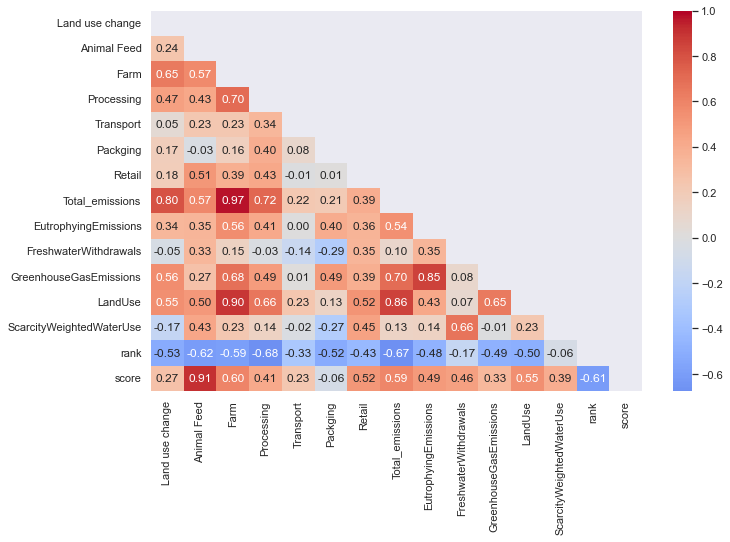

In [74]:
FP=FoodProduction
#let's look at the correlation matrix
corr = FP.corr()
plt.figure(figsize=(11,7))

cmap=sns.color_palette("coolwarm", as_cmap=True)
mask = np.triu(np.ones_like(corr, dtype=bool)) #code from https://seaborn.pydata.org/examples/many_pairwise_correlations.html 
sns.heatmap(corr, mask=mask, vmax=1, center=0, cmap=cmap, annot=True, fmt='.2f')
plt.show()

From looking at the correlation matrix we can observe:
Land use, total emission, and Farm have a strong positive linear correlation.
EutrophyingEmissions are strongly positively correlated with GreenhouseGasEmissions and also to Land use and Farm.
Repeating that score=0 for vegan, score=1 for vegetarian, and score=2 for Meat we can observe that logically Animal Feed is strongly positively correlated to the score. Also is positively correlated with total emission (0,59). 
Must notice that packaging is not correlated linearly to the score, so we will not reduce packaging pollution by changing our diet from omnivorous to vegetarian or to vegan.

In [75]:
FP.groupby("origin").mean().sort_values("score").style.background_gradient(cmap='coolwarm')

,Land use change,Animal Feed,Farm,Processing,Transport,Packging,Retail,Total_emissions,EutrophyingEmissions,FreshwaterWithdrawals,GreenhouseGasEmissions,LandUse,ScarcityWeightedWaterUse,rank,score
origin,,,,,,,,,,,,,,,
Vegan,0.790909,0.000000,1.342424,0.178788,0.181818,0.284848,0.036364,2.815152,15.592669,331.631885,3.832871,4.060524,12808.369747,26.181818,0.000000
Vegetarian,1.900000,1.566667,5.300000,0.266667,0.100000,0.166667,0.200000,9.500000,19.426572,965.517550,4.887866,13.985196,30732.191323,12.000000,1.000000
Meat,3.200000,2.114286,12.714286,0.600000,0.300000,0.242857,0.171429,19.342857,77.414545,877.474514,13.211270,45.092717,26707.487265,6.571429,2.000000


From those means of the 3 groups, we can see how much more Meat products pollute than vegetarian and especially vegan products. To notice again that on average packaging for vegan products are more.

# Conclusions

It is clear from this analysis that products that involve animals are the ones that pollute the most. 
More than 1/5 of our production is for feeding animals and this has a big impact on the total pollution.
From the analysis, we can deduce that having a vegan diet would be way more sustainable. But reducing animal product consumption is not the only thing we should do to be more eco-friendly. In fact, as seen before pollution produced from packaging activities is bigger for vegan products, so if we want to increase their consumption we must find more sustainable ways to pack them. 